# Práctica 3: Visualización dinámica

En esta sesión estudiaremos algunas técnicas para la visualización dinámica de conjuntos de datos que tienen alguna componente temporal, haciendo especial énfasis en aquellos problemas para los que el dinamismo en la representación realmente supone alguna ventaja con respecto a visualizaciones estáticas clásicas.

Comenzaremos con una breve descripción técnica de las herramientas que utilizaremos para generar las animaciones, así como su integración con los cuadernos de Jupyter. A continuación, presentaremos diferentes ejemplos de problemas para los cuales la visualización dinámica permite comprender más en detalle el conjunto de datos o su comportamiento.

## Visualización interactiva con `matplotlib`

Matplotlib da soporte explícito para la creación de animaciones a través de la API [`matplotlib.animation`](https://matplotlib.org/stable/api/animation_api.html). En este paquete podemos encontrar distintas clases y métodos para crear animaciones, controlar su ciclo de vida, reproducirlas y exportarlas a un formato conveniente. En la documentación oficial podemos encontrar también diversos [ejemplos ilustrativos](https://matplotlib.org/stable/api/animation_api.html#examples).

Esta API está soportada desde la versión 1.4 de `matplotlib` mediante el uso de un *backend* interactivo, como `notebook` o `ipympl`. Esto es necesario debido a que la opción clásica `%matplotlib inline` sólo permite generar imágenes estáticas. El *backend* lo seleccionaremos con el siguiente [`magic`](http://ipython.readthedocs.org/en/stable/interactive/tutorial.html#magic-functions):

In [46]:
!pip install ipympl

In [47]:
%matplotlib ipympl

Comprobamos las capacidades de este backend creando una gráfica sencilla:

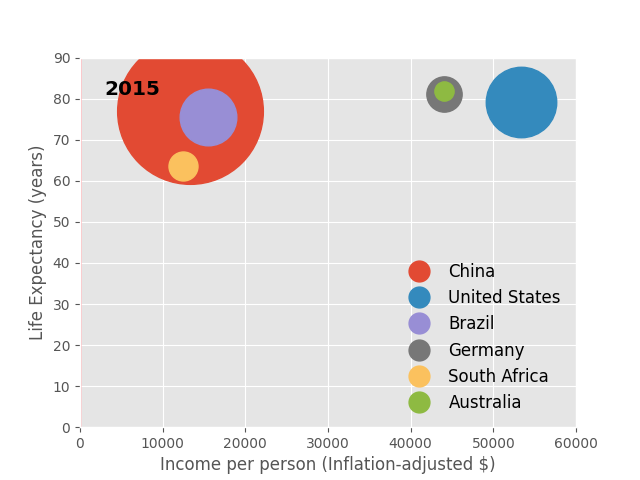

In [48]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('ggplot')
plt.plot(np.arange(-5, 5, 0.1) ** 3)
# Es necesario llamar a plt.show() para que se muestre la gráfica con el backend ipympl
plt.show()

Como podemos ver, la gráfica resultante es interactiva, lo que nos permite hacer zoom, desplazar los ejes, modificar el tamaño, etc. Si en algún momento deseamos terminar esta interactividad, podemos hacer que la gráfica se convierta en una imagen estática, equivalente a si usásemos el backend `inline`.

## Análisis de información sociológica

En esta sección utilizaremos animaciones para analizar distintos tipos de información sociológica. El sitio web [Gapminder](http://www.gapminder.org/) es un magnífico repositorio de este tipo de información a nivel mundial, incluyendo series históricas desde el año 1800. En la hoja de cálculo `social_data.xlsx` se incluye información descargada de esta web para distintas variables y países.

Nuestro primer objetivo será **visualizar la evolución temporal** de la **esperanza de vida** de los habitantes de un conjunto de países, frente a la [**renta per cápita** o producto interior bruto (*gross domestic product*, GDP) por habitante](https://en.wikipedia.org/wiki/Per_capita_income).

Hacemos una breve exploración inicial de nuestros datos:

In [49]:
import pandas as pd
from IPython.display import display, HTML

# df = pd.read_excel(r'C:\Users\X542UA\Documents\1º BIG DATA\master_bigdata\VISUALIZACION DE DATOS\ficheros\social_data.xlsx', sheet_name=None)
df = pd.read_excel(r'ficheros\social_data.xlsx', sheet_name=None)
# Para cada hoja de cálculo dentro del archivo, mostramos la cabecera del DataFrame como HTML
for sh in df:
    display(HTML('<h3>' + sh + '</h3>' + df[sh].head().to_html()))

,Country,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,1810,1811,1812,1813,1814,1815,1816,1817,1818,1819,1820,1821,1822,1823,1824,1825,1826,1827,1828,1829,1830,1831,1832,1833,1834,1835,1836,1837,1838,1839,1840,1841,1842,1843,1844,1845,1846,1847,1848,1849,1850,1851,1852,1853,1854,1855,1856,1857,1858,1859,1860,1861,1862,1863,1864,1865,1866,1867,1868,1869,1870,1871,1872,1873,1874,1875,1876,1877,1878,1879,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894,1895,1896,1897,1898,1899,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,1940,1941,1942,1943,1944,1945,1946,1947,1948,1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Afghanistan,28.2110,28.200753,28.190507,28.18026,28.170013,28.159767,28.14952,28.139273,28.129027,28.11878,28.108533,28.098287,28.08804,28.077793,28.067547,28.0573,28.047053,28.036807,28.02656,28.016313,28.006067,27.99582,27.985573,27.975327,27.96508,27.954833,27.944587,27.93434,27.924093,27.913847,27.9036,27.893353,27.883107,27.87286,27.862613,27.852367,27.84212,27.831873,27.821627,27.81138,27.801133,27.790887,27.78064,27.770393,27.760147,27.7499,27.739653,27.729407,27.71916,27.708913,27.698667,27.68842,27.678173,27.667927,27.65768,27.647433,27.637187,27.62694,27.616693,27.606447,27.5962,27.585953,27.575707,27.56546,27.555213,27.544967,27.53472,27.524473,27.514227,27.50398,27.493733,27.483487,27.47324,27.462993,27.452747,27.4425,27.432253,27.422007,27.41176,27.401513,27.391267,27.38102,27.370773,27.360527,27.35028,27.340033,27.329787,27.31954,27.309293,27.299047,27.2888,27.278553,27.268307,27.25806,27.247813,27.237567,27.22732,27.217073,27.206827,27.19658,27.186333,27.176087,27.16584,27.155593,27.145347,27.1351,27.124853,27.114607,27.10436,27.094113,27.083867,27.07362,27.063373,27.053127,27.04288,27.032633,27.022387,27.012140,7.045063,26.991647,26.9814,27.073893,27.166387,27.25888,27.351373,27.443867,27.53636,27.628853,27.721347,27.81384,27.906333,27.998827,28.091320,28.183813,28.276307,28.368800,28.461293,28.553787,28.646280,28.738773,28.831267,28.923760,29.016253,29.108747,29.201240,29.293733,29.386227,29.478720,29.571213,29.663707,29.7562,30.11694,30.73568,31.35442,31.97316,32.5909,33.20964,33.82838,34.44712,35.06586,35.6846,36.30334,36.92308,37.54182,38.15956,38.7753,39.38804,39.99878,40.60552,41.20626,41.8,42.2,42.6,43.0,43.5,44.0,44.5,45.0,44.3,43.5,43.5,44.3,44.2,43.0,41.3,42.8,43.5,45.2,46.9,50.2,50.3,50.2,50.4,50.5,50.1,50.4,50.6,50.7,50.0,50.8,51.0,51.1,51.6,52.1,52.5,52.9,53.2,53.6,54.0,54.5,54.8,55.2,55.5,56.2,56.91,57.63
1,Albania,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.40000,35.400000,35.400000,35.4000,35.400000,35.400

,Country,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,1810,1811,1812,1813,1814,1815,1816,1817,1818,1819,1820,1821,1822,1823,1824,1825,1826,1827,1828,1829,1830,1831,1832,1833,1834,1835,1836,1837,1838,1839,1840,1841,1842,1843,1844,1845,1846,1847,1848,1849,1850,1851,1852,1853,1854,1855,1856,1857,1858,1859,1860,1861,1862,1863,1864,1865,1866,1867,1868,1869,1870,1871,1872,1873,1874,1875,1876,1877,1878,1879,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,1890,1891,1892,1893,1894,1895,1896,1897,1898,1899,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,1940,1941,1942,1943,1944,1945,1946,1947,1948,1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Afghanistan,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,603.0,604.0,604.0,604.0,604.0,604.0,604.0,604.0,604.0,604.0,604.0,604.0,607.0,609.0,611.0,613.0,615.0,617.0,619.0,621.0,623.0,625.0,627.0,630.0,632.0,634.0,636.0,638.0,640.0,643.0,645.0,647.0,649.0,651.0,654.0,656.0,658.0,660.0,663.0,665.0,667.0,669.0,672.0,674.0,676.0,678.0,681.0,683.0,685.0,688.0,690.0,692.0,695.0,697.0,699.0,702.0,704.0,707.0,709.0,711.0,714.0,716.0,719.0,721.0,724.0,726.0,729.0,731.0,734.0,736.0,739.0,741.0,744.0,746.0,749.0,751.0,754.0,756.0,759.0,761.0,764.0,767.0,769.0,772.0,774.0,777.0,780.0,782.0,785.0,788.0,790.0,793.0,796.0,798.0,801.0,804.0,807.0,809.0,812.0,815.0,818.0,820.0,823.0,826.0,829.0,833.0,837.0,841.0,845.0,849.0,853.0,857.0,862.0,868.0,874.0,879.0,885.0,890.0,896.0,902.0,908.0,913.0,919.0,925.0,931.0,937.0,943.0,949.0,955.0,961.0,967.0,973.0,979.0,985.0,991.0,997.0,1004.0,1010.0,1016.0,1022.0,1029.0,1035.0,1050.0,1069.0,1116.0,1122.0,1125.0,1155.0,1134.0,1176.0,1187.0,1206.0,1192.0,1188.0,1185.0,1182.0,1182.0,1168.0,1173.0,1187.0,1178.0,1174.0,1092.0,1046.0,1137.0,1170.0,1201.0,1231.0,1119.0,1179.0,1155.0,1158.0,1284.0,1402.0,1454.0,1429.0,1384.0,1486.0,1230.0,1113.0,1087.0,1028.0,1022.0,941.0,810.0,725.0,872.0,895.0,921.0,947.0,972.0,962.0,862.0,1053.0,1097.0,1067.0,1146.0,1173.0,1298.0,1311.0,1548.0,1637.0,1695.0,1893.0,1884.0,1877.0,1925.0
1,Albania,667.0,667.0,668.0,668.0,668.0,668.0,668.0,668.0,668.0,668.0,668.0,668.0,669.0,669.0,669.0,669.0,669.0,669.0,669.0,669.0,669.0,671.0,672.0,674.0,676.0,677.0,679.0,680.0,682.0,683.0,685.0,686.0,688.0,689.0,691.0,693.0,694.0,696.0,697.0,699.0,701.0,702.0,704.0,705.0,707.0,709.0,710.0,712.0,713.0,715.0,717.0,718.0,720.0,722.0,723.0,725.0,727.0,728.0,730.0,731.0,733.0,735.0,736.0,738.0,740.0,742.0,743.0,745.0,747.0,748.0,750.0,761.0,773.0,784.0,796.0,808.0,820.0,832.0,844.0,857.0,870.0,882.0,896.0,909.0,922.0,936.0,950.0,964.0,979.0,993.0,1008.0,1022.0,1036.0,1051.0,1065.0,1080.0,1095.0,1110.0,1125.0,1141.0,1157.0,1172.0,1188.0,1203.0,1219.0,1236.0,1252.0,1269.0,1285.0,1302.0,1320.0,1342.0,1365.0,1389.0,1406.0,1424.0,1442.0,1460.0,1479.0,1498.0,1516.0,1535.0,1554.0,1572.0,1591.0,1610.0,1629.0,1647.0,1666.0,1685.0,1696.0,1707.0,1717.0,1728.0,1738.0,1748.0,1758.0,1768.0,1778.0,1788.0,1797.0,1807.0,1816.0,1825.0,1834.0,1842.0,1851.0,1859.0,1867.0,1875.0,1883.0,1965.0,1968.0,2048.0,2108.0,2222.0,2244.0,2387.0,2493.0,2594.0,2724.0,2744.0,2832.0,2926.0,3023.0,3129.0,3242.0,3359.0,3475.0,3587.0,3712.0,3849.0,3988.0,4174.0,4177.0,4178.0,4182.0,4188.0,4194.0,4201.0,4218.0,4227.0,4237.0,4248.0,4259.0,4267.0,4281.0,4294.0,4307.0,4325.0,4350.0,3081.0,2877.0,3172.0,3457.0,3941.0,4326.0,3909.0,4434.0,4912.0,5305.0,5730.0,5913.0,6274.0,6672.0,7075.0,7476.0,7977.0,8644.0,8994.0,9374.0,9640.0,9811.0,9961.0,10160.0,10620.0
2,Algeria,716.0,716.0,717.0,718.0,719.0,720.0,721.0,722.0,723.0,724.0,725.0,726.0,727.0,728.0,729.0,730.0,

,Country,1800,1810,1820,1830,1840,1850,1860,1870,1880,1890,1900,1910,1920,1930,1940,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,3280000.0,3280000.0,3323519.0,3448982.0,3625022.0,3810047.0,3973968.0,4169690.0,4419695.0,4710171.0,5021241.0,5351413.0,5813814.0,6394908.0,7034081.0,7752118.0,7839426.0,7934798.0,8038312.0,8150037.0,8270024.0,8398309.0,8534913.0,8679848.0,8833127.0,8994793.0,9164945.0,9343772.0,9531555.0,9728645.0,9935358.0,10148841.0,10368600.0,10599790.0,10849510.0,11121097.0,11412821.0,11716896.0,12022514.0,12315553.0,12582954.0,12831361.0,13056499.0,13222547.0,13283279.0,13211412.0,12996923.0,12667001.0,12279095.0,11912510.0,11630498.0,11438949.0,11337932.0,11375768.0,11608351.0,12067570.0,12789374.0,13745630.0,14824371.0,15869967.0,16772522.0,17481800.0,18034130.0,18511480.0,19038420.0,19701940.0,20531160.0,21487079.0,22507368.0,23499850.0,24399948.0,25183615.0,25877544.0,26528741.0,27207291.0,27962207.0,28809167.0,29726803.0,30682500.0,31627506.0,32526562.0
2,Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10661.0,10737.0,10813.0,10889.0,10966.0,11043.0,11121.0,11200.0,11279.0,11358.0,11439.0,11519.0,11601.0,11683.0,11765.0,11848.0,11932.0,12016.0,12101.0,12187.0,12273.0,12359.0,12447.0,12535.0,12623.0,12712.0,12802.0,12892.0,12983.0,13075.0,13167.0,13260.0,13354.0,13448.0,13543.0,13639.0,13735.0,13832.0,13930.0,14028.0,14127.0,14227.0,14328.0,14429.0,14531.0,14633.0,14737.0,14841.0,14946.0,15051.0,15157.0,15264.0,15372.0,15481.0,15590.0,15700.0,15700.0,15700.0,15700.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,410445.0,423591.0,438671.0,457234.0,478227.0,506889.0,552800.0,610036.0,672544.0,741688.0,819950.0,901122.0,963956.0,1015991.0,1123210.0,1263171.0,1287499.0,1316086.0,1348097.0,1382881.0,1419969.0,1459089.0,1500152.0,1543224.0,1588478.0,1636054.0,1685901.0,1737645.0,1790533.0,1843596.0,1896125.0,1947786.0,1998695.0,2049147.0,2099657.0,2150602.0,2202040.0,2253842.0,2305999.0,2358467.0,2411229.0,2464338.0,2517869.0,2571845.0,2626290.0,2681245.0,2735329.0,2788315.0,2842620.0,2901590.0,2966799.0,3041003.0,3121336.0,3197064.0,3253659.0,3281453.0,3275438.0,3240613.0,3189623.0,3140634.0,3106727.0,3092034.0,3092471.0,3102898.0,3114851.0,3121965.0,3124093.0,3123112.0,3117045.0,3103758.0,3082172.0,3050741.0,3010849.0,2968026.0,2929886.0,2901883.0,2886010.0,2880667.0,2883281.0,2889676.0,2896679.0
4,Algeria,2503218.0,2595056.0,2713079.0,2880355.0,3082721.0,3299305.0,3536468.0,3811028.0,4143163.0,4525691.0,4946166.0,5404045.0,6063800.0,6876190.0,7797418.0,8872247.0,9039913.0,9216395.0,9405445.0,9609507.0,9829717.0,10065829.0,10316288.0,10578453.0,10848971.0,11124892.0,11404859.0,11690152.0,11985130.0,12295973.0,12626953.0,12980269.0,13354197.0,13744383.0,14144437.0,14550033.0,14960111.0,15377095.0,15804428.0,16247113.0,16709098.0,17190236.0,17690184.0,18212331.0,18760761.0,19337723.0,19943667.0,20575701.0,21228288.0,21893857.0,22565908.0,23241276.0,23917889.0,24591493.0,25257671.0,25912364.0,26554277.0,27180921.0,27785977.0,28362015.0,28904300.0,29411839.0,29887717.0,30336880.0,30766551.0,31183658.0,31590320.0,31990387.0,32394886.0,32817225.0,33267887.0,33749328.0,34261971.0,34811059.0,35401790.0,36036159.0,36717132.0,37439427.0,38186135.0,38934334.0,39666519.0


Como podemos ver, disponemos de información sobre la renta per cápita (GDP), la esperanza de vida, y la población de cada país desde el año 1800.

En la primera parte de la práctica, analizaremos la relación entre esperanza de vida y renta per cápita de los siguientes países: China, EEUU, Brasil, Alemania, Sudáfrica y Australia.

In [50]:
countries = ['China', 'United States', 'Brazil', 'Germany', 'South Africa', 'Australia']
# Indexamos los DataFrames de "GDP" y "Life Expectancy" por países y filtramos los seleccionados
gdp = df['GDP'].set_index('Country').loc[countries]
lfexp = df['Life Expectancy'].set_index('Country').loc[countries]
display(gdp)
display(lfexp)

,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Country,,,,,,,,,,,,,,,,,,,,,
China,985.0,985.0,985.0,985.0,985.0,985.0,985.0,985.0,985.0,985.0,...,6360.0,7225.0,7880.0,8565.0,9430.0,10274.0,11017.0,11805.0,12609.0,13334.0
United States,2128.0,2168.0,2203.0,2167.0,2166.0,2211.0,2252.0,2274.0,2115.0,2218.0,...,50599.0,51011.0,50384.0,48558.0,49373.0,49781.0,50549.0,51282.0,52118.0,53354.0
Brazil,1109.0,1109.0,1109.0,1109.0,1109.0,1110.0,1110.0,1110.0,1110.0,1110.0,...,12732.0,13364.0,13906.0,13749.0,14660.0,15101.0,15234.0,15518.0,15412.0,15441.0
Germany,1639.0,1651.0,1663.0,1674.0,1686.0,1698.0,1710.0,1722.0,1734.0,1746.0,...,39352.0,40693.0,41199.0,38975.0,40632.0,42080.0,42959.0,42887.0,43444.0,44053.0
South Africa,1480.0,1480.0,1480.0,1480.0,1481.0,1481.0,1481.0,1481.0,1481.0,1482.0,...,11597.0,12052.0,12263.0,11903.0,12087.0,12291.0,12375.0,12454.0,12446.0,12509.0
Australia,815.0,816.0,818.0,820.0,822.0,824.0,826.0,828.0,830.0,832.0,...,39416.0,40643.0,41312.0,41170.0,41330.0,41706.0,42522.0,42840.0,43219.0,44056.0


,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Country,,,,,,,,,,,,,,,,,,,,,
China,32.00,32.000000,32.000000,32.00000,32.000000,32.000000,32.00000,32.000000,32.000000,32.00000,...,74.4,74.9,75.1,75.6,75.9,76.1,76.3,76.5,76.70,76.90
United States,39.41,39.410000,39.410000,39.41000,39.410000,39.410000,39.41000,39.410000,39.410000,39.41000,...,77.8,78.1,78.2,78.3,78.5,78.7,78.8,78.9,79.00,79.10
Brazil,32.00,31.999807,31.999613,31.99942,31.999227,31.999033,31.99884,31.998647,31.998453,31.99826,...,73.7,73.8,73.9,74.0,74.2,74.5,74.7,75.0,75.30,75.60
Germany,38.37,38.370000,38.370000,38.37000,38.370000,38.370000,38.37000,38.370000,38.370000,38.37000,...,79.7,79.8,80.0,80.0,80.2,80.3,80.5,80.7,80.90,81.10
South Africa,33.50,33.500000,33.500000,33.50000,33.500000,33.500000,33.50000,33.500000,33.500000,33.50000,...,53.3,54.1,55.0,55.8,56.7,57.5,58.8,60.4,62.04,63.72
Australia,34.05,34.050000,34.050000,34.05000,34.050000,34.050000,34.05000,34.050000,34.050000,34.05000,...,81.4,81.5,81.5,81.6,81.7,81.8,81.8,81.8,81.80,81.80


Como primera exploración visual, dibujamos un gráfico de burbujas que muestre la relación en el año 2015 entre la esperanza de vida y la renta per cápita para los países seleccionados.

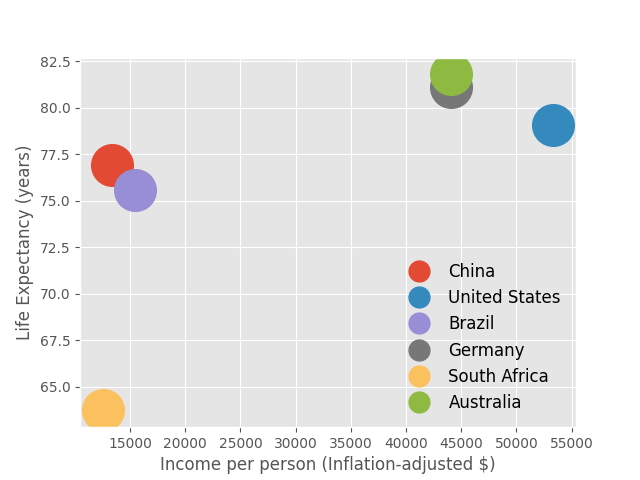

In [51]:
fig = plt.figure()
ax = fig.add_subplot(111)
# Configuración de las etiquetas de los ejes
plt.xlabel('Income per person (Inflation-adjusted $)')
plt.ylabel('Life Expectancy (years)')
# Creación de un punto para cada país
for country in countries:
    plt.plot([gdp[2015][country]], [lfexp[2015][country]], 'o', label=country, markersize=30)
# Inclusión de una leyenda
ax.legend(loc='lower right', fontsize=12, markerscale=0.5, numpoints=1, frameon=False)

### Ejercicio

*Crear una animación a partir de la gráfica anterior, que permita visualizar la evolución de la relación entre renta per cápita y esperanza de vida durante toda la serie temporal disponible.*

La forma más simple y recomendada de crear una animación en matplotlib es a través de la función [`FuncAnimation`](http://matplotlib.org/api/animation_api.html#matplotlib.animation.FuncAnimation), que genera el conjunto de *frames* a partir de la ejecución repetida de una función definida por el usuario (en este caso, la función `update_plot`). Los valores de los argumentos pasados a esta función y el intervalo entre imágenes consecutivas se controlan con los parámetros `frames` e `interval`.

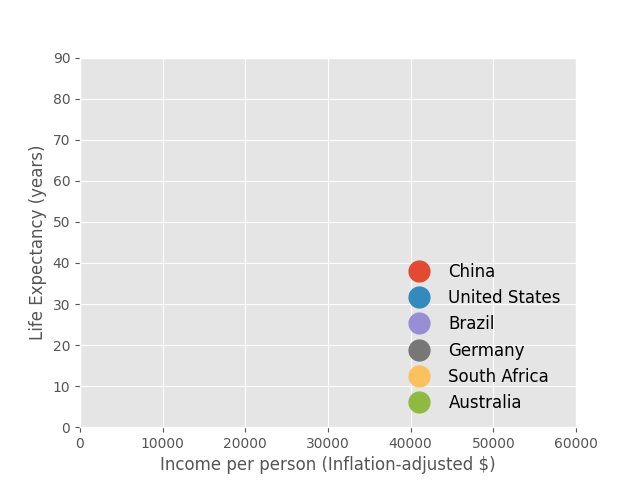

In [52]:
import matplotlib.animation as animation

fig = plt.figure()
ax = fig.add_subplot(111)
# Configuración de los límites de la gráfica y de las etiquetas de los ejes
ax.set_xlim((0, 60000))
ax.set_ylim((0, 90))
plt.xlabel('Income per person (Inflation-adjusted $)')
plt.ylabel('Life Expectancy (years)')
# Creación de un punto para cada país, inicialmente sin datos
circs = {}
for country in countries:
    circs[country] = plt.plot([], [], 'o', label=country, markersize=30)[0]
# Leyenda y etiqueta para el año actual
ax.legend(loc='lower right', fontsize=12, markerscale=0.5, numpoints=1, frameon=False)
cur_year = ax.annotate("", (0.05, 0.9), xycoords='axes fraction', size='x-large', weight='bold')

def update_plot(year):
    """
    Función de animación, en la que se actualiza la posición del punto correspondiente
    a cada país, así como la etiqueta del año actual.
    """
    # Actualizar el centro de cada punto con set_data
    for country in countries:
        circs[country].set_data([gdp[year][country]], [lfexp[year][country]])
    # Actualizar la etiqueta del año correspondiente con set_text
    cur_year.set_text(year)
    return list(circs.values()) + [cur_year]

# Creamos la animación, ejecutando la función 'update_plot' para cada año del DataFrame
ani = animation.FuncAnimation(fig, update_plot, frames=gdp.keys(), interval=100, repeat=False)

### Exportando animaciones a través del paquete `JSAnimation`

Otro método recomendado para visualizar animaciones con matplotlib en un cuaderno de Jupyter es el uso del paquete [JSAnimation](https://github.com/jakevdp/JSAnimation) que [forma parte de matplotlib desde la versión 2.1](https://matplotlib.org/stable/users/prev_whats_new/whats_new_2.1.0.html#interactive-js-widgets-for-animation).

Este paquete permite reproducir animaciones ya generadas sin la necesidad de utilizar un intérprete de Python cada vez que se quieran mostrar. La animación se almacena completamente en el código HTML y se reproduce utilizando JavaScript.

JSAnimation puede recibir cualquier objeto de tipo [`Animation`](https://matplotlib.org/stable/api/animation_api.html#animation) y generar un HTML dinámico que puede incluirse en cualquier página web, incluido un cuaderno de Jupyter exportado como HTML. Además, incluye un conjunto de controles que permiten pausar, modificar la velocidad de la animación o seleccionar un instante concreto de la misma.

El único inconveniente de usar este paquete es que la animación debe ser renderizada completamente antes de comenzar a reproducirse, lo que puede resultar incómodo para programar y depurar. Además, el archivo de cuaderno resultante será considerablemente más grande, ya que almacena la información binaria de todas las imágenes que componen las animaciones.

A continuación se muestra la misma animación del ejemplo anterior renderizada a través de `JSAnimation`.

In [53]:
HTML(ani.to_jshtml())

### Ejercicio

*Crear una nueva animación en la cual el tamaño del marcador correspondiente a cada país se actualice en función de la población. Utilizar para ello la función `get_population_markersize` que se proporciona a continuación:*

In [54]:
import matplotlib.animation as animation

def get_population_markersize(pop):
    """
    Función para obtener el tamaño del marcador correspondiente a una determinada población.
    A una población de 2 millones se corresponde un tamaño 4.0, que escalará de forma que
    la superficie del marcador sea proporcional a esta relación.
    """
    return 4*np.sqrt(pop/2e6)

Además de esta función, es necesario tener en cuenta que los datos de población no están disponibles para todos los años en la serie temporal.

In [55]:
pop = df['Population'].set_index('Country').loc[countries]
display(pop)

,1800,1810,1820,1830,1840,1850,1860,1870,1880,1890,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Country,,,,,,,,,,,,,,,,,,,,,
China,321675013.0,350542958.0,380055273.0,402373519.0,411213424.0,402711280.0,380047548.0,363661158.0,365544192.0,377135349.0,...,1.312601e+09,1.319625e+09,1.326691e+09,1.333807e+09,1.340969e+09,1.348174e+09,1.355387e+09,1.362514e+09,1.369436e+09,1.376049e+09
United States,6801854.0,8294928.0,10361646.0,13480460.0,17942443.0,24136293.0,31936643.0,40821569.0,51256498.0,63810074.0,...,2.988605e+08,3.016560e+08,3.044731e+08,3.072320e+08,3.098762e+08,3.123904e+08,3.147995e+08,3.171359e+08,3.194486e+08,3.217736e+08
Brazil,3639636.0,4058652.0,4582325.0,5301068.0,6206694.0,7254194.0,8466005.0,9964419.0,11893392.0,14410738.0,...,1.906982e+08,1.927845e+08,1.947697e+08,1.967013e+08,1.986142e+08,2.005176e+08,2.024016e+08,2.042594e+08,2.060779e+08,2.078475e+08
Germany,22886919.0,23882461.0,25507768.0,28016571.0,31016143.0,33663143.0,36383150.0,39702235.0,43577358.0,48211294.0,...,8.105590e+07,8.085452e+07,8.066591e+07,8.051968e+07,8.043531e+07,8.042466e+07,8.047795e+07,8.056586e+07,8.064626e+07,8.068854e+07
South Africa,1440820.0,1494779.0,1577125.0,1714970.0,1894070.0,2091873.0,2310179.0,2629836.0,3142066.0,3845849.0,...,4.902780e+07,4.969358e+07,5.034881e+07,5.099203e+07,5.162159e+07,5.223727e+07,5.283727e+07,5.341661e+07,5.396905e+07,5.449041e+07
Australia,351014.0,342440.0,334002.0,348143.0,434095.0,742619.0,1256048.0,1724213.0,2253007.0,3088808.0,...,2.060623e+07,2.097595e+07,2.137035e+07,2.177069e+07,2.216286e+07,2.254237e+07,2.291138e+07,2.327046e+07,2.362235e+07,2.396897e+07


Actualizamos el conjunto de años para los DataFrames de "GDP" y "Life Expectancy", ya que no coinciden con los de "Population".

In [56]:
gdp_filt = gdp[pop.columns]
lfexp_filt = lfexp[pop.columns]
display(gdp_filt)
display(lfexp_filt)

,1800,1810,1820,1830,1840,1850,1860,1870,1880,1890,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Country,,,,,,,,,,,,,,,,,,,,,
China,985.0,985.0,985.0,986.0,986.0,985.0,1023.0,1099.0,1015.0,918.0,...,6360.0,7225.0,7880.0,8565.0,9430.0,10274.0,11017.0,11805.0,12609.0,13334.0
United States,2128.0,2283.0,2242.0,2552.0,2792.0,3059.0,3714.0,4058.0,5292.0,5646.0,...,50599.0,51011.0,50384.0,48558.0,49373.0,49781.0,50549.0,51282.0,52118.0,53354.0
Brazil,1109.0,1110.0,1112.0,1136.0,1160.0,1185.0,1358.0,1488.0,1455.0,1492.0,...,12732.0,13364.0,13906.0,13749.0,14660.0,15101.0,15234.0,15518.0,15412.0,15441.0
Germany,1639.0,1759.0,1887.0,2024.0,2102.0,2182.0,2509.0,2819.0,3057.0,3733.0,...,39352.0,40693.0,41199.0,38975.0,40632.0,42080.0,42959.0,42887.0,43444.0,44053.0
South Africa,1480.0,1482.0,1484.0,1634.0,1469.0,1308.0,1626.0,1696.0,3400.0,3052.0,...,11597.0,12052.0,12263.0,11903.0,12087.0,12291.0,12375.0,12454.0,12446.0,12509.0
Australia,815.0,834.0,853.0,1399.0,2269.0,3267.0,4795.0,5431.0,7120.0,7418.0,...,39416.0,40643.0,41312.0,41170.0,41330.0,41706.0,42522.0,42840.0,43219.0,44056.0


,1800,1810,1820,1830,1840,1850,1860,1870,1880,1890,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Country,,,,,,,,,,,,,,,,,,,,,
China,32.00,32.000000,32.000000,32.0000,32.000000,32.000000,28.8500,31.957143,32.000000,32.000000,...,74.4,74.9,75.1,75.6,75.9,76.1,76.3,76.5,76.70,76.90
United States,39.41,39.410000,39.410000,39.4100,39.410000,39.410000,39.4100,39.410000,39.410000,45.210000,...,77.8,78.1,78.2,78.3,78.5,78.7,78.8,78.9,79.00,79.10
Brazil,32.00,31.998067,31.996133,31.9942,31.992267,31.990333,31.9884,31.986467,31.984533,31.982600,...,73.7,73.8,73.9,74.0,74.2,74.5,74.7,75.0,75.30,75.60
Germany,38.37,38.370000,38.370000,38.3700,38.370000,38.370000,38.3700,38.370000,38.905000,40.910000,...,79.7,79.8,80.0,80.0,80.2,80.3,80.5,80.7,80.90,81.10
South Africa,33.50,33.500000,33.500000,33.5000,33.500000,33.500000,33.5000,33.500000,33.500000,33.500000,...,53.3,54.1,55.0,55.8,56.7,57.5,58.8,60.4,62.04,63.72
Australia,34.05,34.050000,34.050000,34.0500,34.050000,34.050000,34.0500,34.050000,39.342157,44.634314,...,81.4,81.5,81.5,81.6,81.7,81.8,81.8,81.8,81.80,81.80


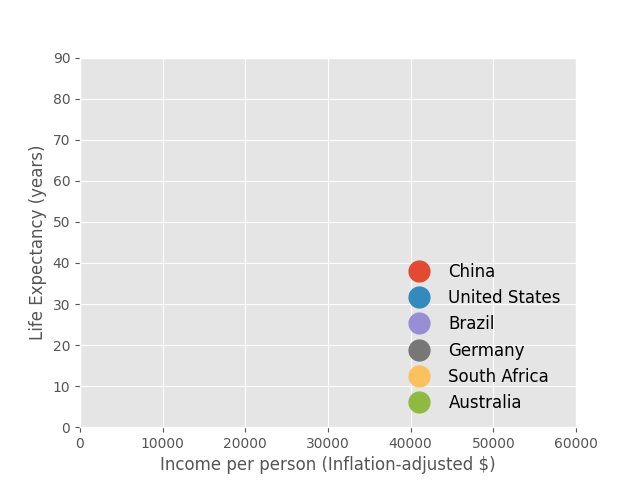

In [57]:
fig = plt.figure()
ax = fig.add_subplot(111)
# Configuración de los límites de la gráfica y de las etiquetas de los ejes
ax.set_xlim((0, 60000))
ax.set_ylim((0, 90))
plt.xlabel('Income per person (Inflation-adjusted $)')
plt.ylabel('Life Expectancy (years)')
# Creación del punto para cada país
circs = {}
for country in countries:
    circs[country] = plt.plot([], [], 'o', label=country, markersize=30)[0]
# Leyenda y etiqueta para el año actual
ax.legend(loc='lower right', fontsize=12, markerscale=0.5, numpoints=1, frameon=False)
cur_year = ax.annotate("", (0.05, 0.9), xycoords='axes fraction', size='x-large', weight='bold')

def update_plot(year):
    """
    Función de animación, en la que se actualiza la posición y el tamaño del punto
    correspondiente a cada país, así como la etiqueta del año actual.
    """
    # En este caso, además de actualizar la etiqueta del año con "set_text" y la posición
    # de cada punto con "set_data", debemos actualizar el tamaño de cada punto con "set_markersize"
    for country in countries:
        circs[country].set_data([gdp_filt[year][country]], [lfexp_filt[year][country]])
        circs[country].set_markersize(get_population_markersize(pop[year][country]))
    # Actualizar la etiqueta del año correspondiente con set_text
    cur_year.set_text(year)
    return list(circs.values()) + [cur_year]

# Creamos la animación con "FuncAnimation"
ani = animation.FuncAnimation(fig, update_plot, frames=gdp_filt.keys(), interval=100, repeat=False)

### Ejercicio

*Repetir la animación anterior, pero incluyendo todos los años entre 1800 y 2015. Para aquellos años en los cuales no se dispone de datos de población, realizar una interpolación lineal para obtener una estimación del valor.*

c:\Users\X542UA\AppData\Local\Programs\Python\Python313\Lib\site-packages\matplotlib\animation.py:872: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


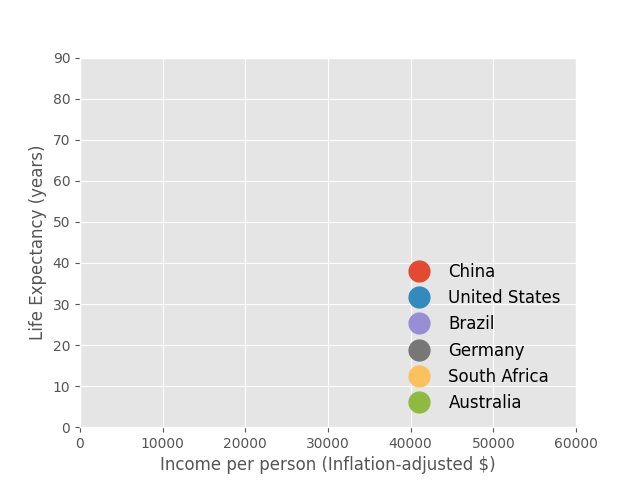

In [58]:
from scipy import interpolate

old_years = pop.columns
new_years = gdp.columns
interpolated_pop = pd.DataFrame(index=countries, columns=new_years)

for country in countries:
    interp_func = interpolate.interp1d(old_years, pop.loc[country].to_numpy(), bounds_error=False, fill_value="extrapolate")
    interpolated_pop.loc[country] = interp_func(np.array(new_years).astype("int64"))

years_not_in_old = [year for year in new_years if year not in old_years]
new_pop = pd.concat([pop, interpolated_pop[years_not_in_old]], axis=1)
new_pop = new_pop[np.sort(new_pop.columns.values)]

fig = plt.figure()
ax = fig.add_subplot(111)
# Configuración de los límites de la gráfica y de las etiquetas de los ejes
ax.set_xlim((0, 60000))
ax.set_ylim((0, 90))
plt.xlabel('Income per person (Inflation-adjusted $)')
plt.ylabel('Life Expectancy (years)')
# Creación del punto para cada país
circs = {}
for country in countries:
    circs[country] = plt.plot([], [], 'o', label=country, markersize=30)[0]
# Leyenda y etiqueta para el año actual
ax.legend(loc='lower right', fontsize=12, markerscale=0.5, numpoints=1, frameon=False)
cur_year = ax.annotate("", (0.05, 0.9), xycoords='axes fraction', size='x-large', weight='bold')

def update_plot(year):
    """
    Función de animación, en la que se actualiza la posición y el tamaño del punto
    correspondiente a cada país, así como la etiqueta del año actual.
    """
    # En este caso, además de actualizar la etiqueta del año con "set_text" y la posición
    # de cada punto con "set_data", debemos actualizar el tamaño de cada punto con "set_markersize"
    for country in countries:
        circs[country].set_data([gdp[year][country]], [lfexp[year][country]])
        circs[country].set_markersize(get_population_markersize(new_pop[year][country]))
    # Actualizar la etiqueta del año correspondiente con set_text
    cur_year.set_text(year)
    return list(circs.values()) + [cur_year]

# Creamos la animación con "FuncAnimation"
ani = animation.FuncAnimation(fig, update_plot, frames=gdp.keys(), interval=100, repeat=False)

### Ejercicio

*Crear una animación que muestre las pirámides de población resultantes de las [proyecciones de población para los años 2015-2064 del Instituto Nacional de Estadística](http://www.ine.es/dyngs/INEbase/es/operacion.htm?c=Estadistica_C&cid=1254736176953&menu=resultados&idp=1254735572981), que se encuentran en el fichero `population_projection.xlsx`*.

En primer lugar, leemos los datos, e indexamos cada una de las tablas (hombres y mujeres) por la edad, para facilitar el acceso a los datos de interés.

In [59]:
df = pd.read_excel(r'ficheros\population_projection.xlsx', sheet_name=None)
men, women = df['Varones'], df['Mujeres']
men.set_index('Edad', inplace=True)
women.set_index('Edad', inplace=True)
display(men.head(), men.tail())
display(women.head(), women.tail())

,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
Edad,,,,,,,,,,,,,,,,,,,,,
0,211154,204307,197701,191420,185544,180143,175265,170942,167184,163982,...,130097,128151,126418,124894,123564,122419,121452,120648,119993,119475
1,218384,210948,204211,197703,191507,185706,180369,175546,171271,167552,...,132899,130753,128814,127088,125569,124244,123104,122140,121340,120688
2,233564,218098,210803,204167,197747,191629,185896,180617,175845,171613,...,135863,133526,131388,129456,127736,126223,124902,123766,122806,122009
3,242660,233099,217818,210657,204118,197784,191741,186073,180852,176129,...,138964,136460,134132,132002,130077,128364,126856,125541,124410,123454
4,246726,242225,232653,217547,210511,204063,197810,191839,186233,181066,...,142158,139519,137026,134707,132586,130668,128962,127460,126150,125023


,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
Edad,,,,,,,,,,,,,,,,,,,,,
95,6767,8043,9434,10416,11263,11919,12738,13990,14589,16186,...,77185,81065,82840,86769,92060,98796,99798,103065,107470,109076
96,4741,5190,6201,7314,8120,8826,9388,10084,11131,11664,...,65418,68763,72387,74141,77830,82757,89004,90094,93234,97413
97,3256,3558,3920,4712,5591,6245,6828,7304,7890,8757,...,54922,58055,61178,64562,66287,69750,74338,80131,81291,84307
98,2336,2415,2657,2948,3564,4256,4784,5263,5664,6155,...,43937,48702,51616,54533,57694,59382,62635,66913,72294,73506
99,1524,1704,1775,1967,2197,2674,3214,3637,4027,4361,...,36363,38844,43178,45887,48611,51563,53207,56262,60250,65251


,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
Edad,,,,,,,,,,,,,,,,,,,,,
0,198316,191878,185668,179764,174241,169164,164579,160517,156984,153975,...,122124,120297,118671,117241,115993,114918,114011,113257,112643,112156
1,205927,198137,191802,185683,179858,174404,169387,164854,160835,157340,...,124761,122747,120928,119308,117883,116639,115569,114665,113914,113303
2,219648,205648,198004,191764,185728,179976,174586,169624,165138,161160,...,127545,125353,123347,121533,119919,118499,117261,116195,115294,114546
3,228281,219198,205363,197859,191710,185754,180074,174745,169838,165398,...,130451,128101,125917,123918,122112,120504,119090,117856,116794,115897
4,231484,227856,218751,205074,197701,191639,185760,180147,174878,170022,...,133433,130957,128617,126441,124450,122651,121050,119641,118412,117355


,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
Edad,,,,,,,,,,,,,,,,,,,,,
95,20190,23895,25521,28676,29794,31765,33047,35648,36508,40178,...,132398,138288,140039,145187,152026,162281,162675,165787,171933,172688
96,15585,16026,19054,20445,23078,24085,25790,26945,29186,30012,...,114688,119385,124946,126778,131693,138159,147755,148382,151490,157379
97,11033,12091,12501,14939,16114,18283,19177,20634,21662,23572,...,98378,102821,107271,112513,114407,119090,125192,134157,134990,138082
98,7908,8378,9239,9612,11553,12535,14304,15087,16323,17228,...,80046,87888,92079,96291,101230,103166,107626,113386,121763,122771
99,5682,5863,6255,6945,7273,8795,9603,11025,11700,12733,...,67016,71010,78175,82114,86089,90728,92687,96922,102346,110155


Como vemos, disponemos de datos para cada posible valor de edad entre 1 y 99 años. Sin embargo, a la hora de realizar pirámides de población, es habitual establecer grupos de edad [en intervalos de 5 años](http://www.ine.es/prensa/np813.pdf). Esto lo podemos hacer de forma muy sencilla con pandas y las funciones [`cut()`](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.cut.html) y [`groupby()`](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.groupby.html).

In [60]:
categories, bins = pd.cut(women.index, np.append(women.index[::5], 100), retbins=True, )
# Tanto para la serie de varones como de mujeres, debemos agrupar por las categorías creadas,
# utilizando la función "groupby", y a continuación agregar el resultado sumando los valores
# de cada categoría, con la función "aggregate"
gwomen = women.groupby(categories).aggregate(np.sum)
gmen = men.groupby(categories).aggregate(np.sum)
display(gmen.head())
display(gwomen.head())

C:\Users\X542UA\AppData\Local\Temp\ipykernel_1676\4083208127.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gwomen = women.groupby(categories).aggregate(np.sum)
C:\Users\X542UA\AppData\Local\Temp\ipykernel_1676\4083208127.py:5: FutureWarning: The provided callable <function sum at 0x00000234D2405080> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  gwomen = women.groupby(categories).aggregate(np.sum)
C:\Users\X542UA\AppData\Local\Temp\ipykernel_1676\4083208127.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future defa

,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
"(0, 5]",1194082,1150557,1107320,1062330,1021197,989576,959847,931928,906149,882761,...,695289,682948,671422,660831,651237,642655,635070,628453,622757,617920
"(5, 10]",1276306,1279845,1275044,1260401,1234931,1186221,1145115,1104198,1061262,1022353,...,773181,761209,748495,735428,722379,709669,697562,686251,675860,666446
"(10, 15]",1167149,1190430,1208489,1233026,1256311,1279386,1282763,1278119,1264120,1239272,...,829403,825566,819831,812256,803007,792329,780544,768026,755156,742306
"(15, 20]",1106686,1114050,1131303,1148043,1164488,1188969,1213193,1231950,1256675,1279972,...,859149,862057,864226,865303,864967,862988,859205,853545,846064,836928
"(20, 25]",1211367,1188519,1169695,1154220,1141765,1137213,1146449,1165080,1183252,1200911,...,892949,894410,896749,899707,902983,906238,909122,911276,912348,912024


,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,...,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064
"(0, 5]",1121432,1081813,1041376,998715,959803,929329,901381,875137,850906,828924,...,652644,641064,630249,620309,611306,603253,596138,589930,584584,580047
"(5, 10]",1198859,1200737,1194488,1181150,1157641,1113257,1075802,1037443,996719,959943,...,724995,713760,701829,689567,677323,665397,654038,643424,633675,624841
"(10, 15]",1103279,1122745,1141470,1161752,1182032,1200238,1201999,1195934,1183156,1160159,...,776140,772539,767158,760050,751369,741352,730294,718549,706475,694420
"(15, 20]",1045155,1054888,1070733,1086624,1101213,1127062,1147486,1166801,1187283,1207551,...,807072,809795,811827,812834,812517,810658,807109,801799,794781,786211
"(20, 25]",1176198,1150297,1129121,1115431,1103590,1098008,1108583,1125212,1141914,1157313,...,859813,861172,863353,866116,869176,872219,874912,876926,877924,877615


Para la visualización de los datos, el método [`barh()`](http://matplotlib.org/api/pyplot_api.html#matplotlib.pyplot.barh) de matplotlib nos proporciona una forma directa de representar las pirámides de población, necesitando únicamente pequeños ajustes estéticos.

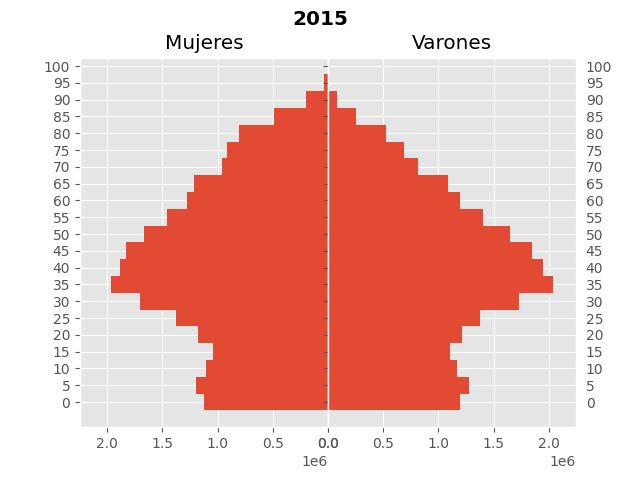

In [61]:
# Creamos dos gráficas que comparten el eje Y
fig, (axw, axm) = plt.subplots(ncols=2, sharey=True)
# Eliminamos el espacio horizontal
plt.subplots_adjust(wspace=0)
# Primer año en la serie temporal
first_year = next(iter(gwomen))
# Etiqueta que muestra el año que se está visualizando
cur_year = plt.suptitle(str(first_year), size='x-large', weight='bold')
# Obtenemos el máximo de la coordenada X
xmax = max(np.amax(gwomen.values), np.amax(gmen.values))
# Establecemos el rango de X para las dos gráficas
axw.set_xlim((0, 1.1 * xmax))
axm.set_xlim((0, 1.1 * xmax))
# La gráfica de mujeres (a la izquierda) deberá estar invertida
axw.invert_xaxis()
# Otros ajustes estéticos
axw.yaxis.set_ticks(bins)
axm.tick_params(labelright=True)
axw.set_title('Mujeres')
axm.set_title('Varones')
# Creamos la gráfica para mujeres y para varones con la función barh
wbars = axw.barh(bins[:-1], gwomen[first_year].values, height=5)
mbars = axm.barh(bins[:-1], gmen[first_year].values, height=5)

def update_pyramid(year):
    """Actualizamos la pirámide de población"""
    # Para cada una de las barras en "wbars" y "mbars", debemos actualizar
    # su tamaño con la función "set_width". Finalmente, actualizaremos
    # también el título, referenciado por la etiqueta "cur_year"
    for bar, new_width in zip(wbars, gwomen[year]):
        bar.set_width(new_width)
    for bar, new_width in zip(mbars, gmen[year]):
        bar.set_width(new_width)
    cur_year.set_text(str(year))
    return (wbars, mbars, cur_year)

# Creamos la animación, utilizando "FuncAnimation" y pasando como parámetro "frames" el conjunto
# de años para los que disponemos de datos. En este caso, el parámetro "interval" será de 500ms
ani = animation.FuncAnimation(fig, update_pyramid, frames=gwomen.keys(), interval=500, repeat=False)
plt.show()

## Recursos adicionales para visualizaciones dinámicas e interactivas en Python

En esta introducción a las herramientas de visualización dinámica nos hemos centrado en el paquete `matplotlib`, al ser el más popular dentro del ecosistema Python. Sin embargo, existen otras librerías, normalmente basadas o compatibles con `matplotlib`, que pueden resultar muy útiles a la hora de crear visualizaciones dinámicas e interactivas. Destacamos las siguientes:

- [Bokeh](https://bokeh.org/)
- [mpld3](https://mpld3.github.io/)
- [NVD3](https://nvd3.org/)
- [Plotly](https://plotly.com/python/)
- [Vega-Altair](https://altair-viz.github.io/)